# Introduction


Optical character recognition (OCR) is a technology designed to identify and extract text from images, including scanned documents and photographs. You might have encountered situations where you opted to capture a photo of text instead of taking notes or because it's a quicker alternative to typing. Thankfully, with the prevalence of smartphones, OCR technology allows us to effortlessly extract and copy text from images, eliminating the need for manual retyping.

In this project, we're going to use 3 different python libraries to extract text from images. We're goiong to be working on a dataset called TextOCR which has over a million annotations for text in images.

In [1]:
import numpy as np
import pandas as pd
from glob import glob 
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from PIL import Image
plt.style.use('ggplot')

# 1. Explore the Dataset

In [2]:
annot=pd.read_parquet('/kaggle/input/textocr-text-extraction-from-images-dataset/annot.parquet')
annot.head()

,id,image_id,bbox,utf8_string,points,area
0,a4ea732cd3d5948a_1,a4ea732cd3d5948a,"[525.83, 3.4, 197.64, 33.94]",Performance,"[525.83, 3.4, 723.47, 7.29, 722.76, 36.99, 525...",6707.90
1,a4ea732cd3d5948a_2,a4ea732cd3d5948a,"[534.67, 64.68, 91.22, 38.19]",Sport,"[535.73, 64.68, 623.41, 67.51, 625.89, 102.87,...",3483.69
2,a4ea732cd3d5948a_3,a4ea732cd3d5948a,"[626.95, 63.62, 96.52, 31.82]",Watch,"[626.95, 63.62, 721.7, 63.62, 723.47, 95.44, 6...",3071.27
3,a4ea732cd3d5948a_4,a4ea732cd3d5948a,"[577.4, 141.87, 147.13, 43.1]",...period.,"[580.02, 143.61, 724.53, 141.87, 723.66, 184.9...",6341.30
4,a4ea732cd3d5948a_5,a4ea732cd3d5948a,"[391.03, 163.9, 60.82, 38.65]",.,"[395.2, 163.9, 451.85, 191.94, 445.59, 202.55,...",2350.69


In [3]:
images=pd.read_parquet('/kaggle/input/textocr-text-extraction-from-images-dataset/img.parquet')
image_file_names=glob('/kaggle/input/textocr-text-extraction-from-images-dataset/train_val_images/train_images/*')

## Plot Some Images

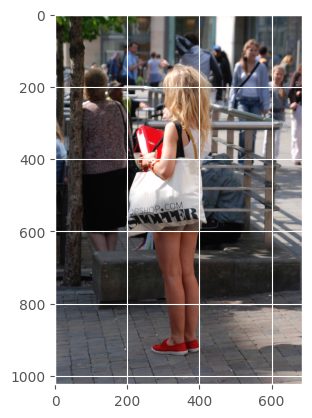

In [4]:
plt.imshow(plt.imread(image_file_names[50]))

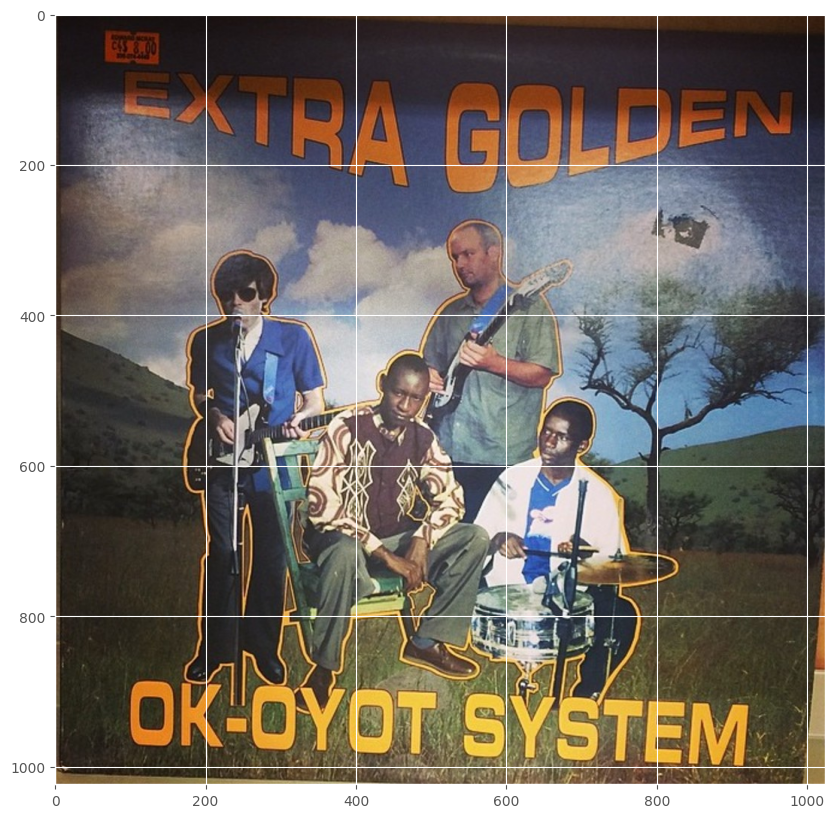

In [5]:
#plot image
fig,ax= plt.subplots(figsize=(10,10))
ax.imshow(plt.imread(image_file_names[0]))
plt.show()

In [6]:
image_id=image_file_names[0].split('/')[-1].split(('.'))[0]
annot.query('id==@image_id')

,id,image_id,bbox,utf8_string,points,area


### Display for the first 20 images

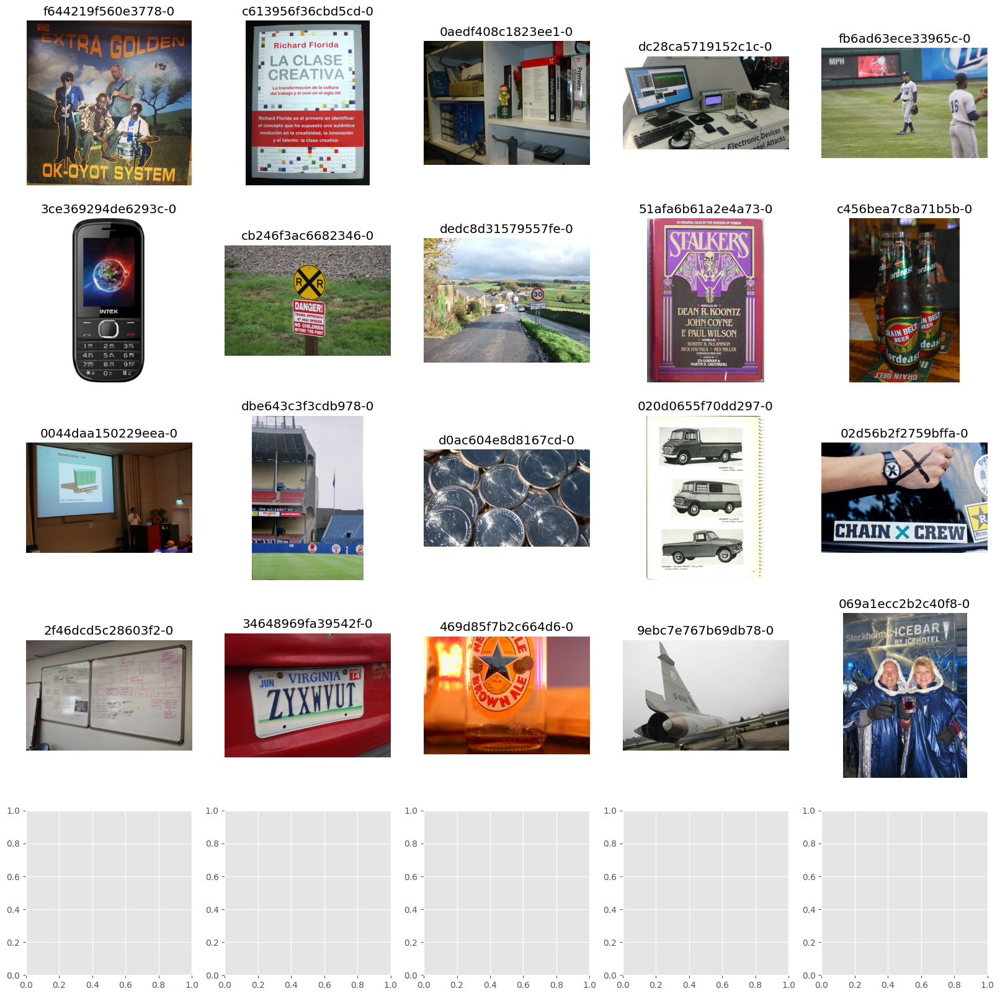

In [7]:
fig, ax=plt.subplots(5,5,figsize=(20,20))
ax=ax.flatten()
for i in range(20):
    ax[i].imshow(plt.imread(image_file_names[i]))
    ax[i].axis('off')
    image_id=image_file_names[i].split('/')[-1].rstrip('.jpg')
    n_annot=len(annot.query('id==@image_id'))
    ax[i].set_title(f'{image_id}-{n_annot}')
plt.show()

# 2. Pytesseract

In [8]:
import pytesseract
#example of call
print(pytesseract.image_to_string(image_file_names[20],lang='eng'))

VX POLO, SKY BLUE (M00800-454) $34/$85



# 3. Easyocr

In [9]:
import easyocr
reader= easyocr.Reader(['en'],gpu=True)

In [10]:
results=reader.readtext(image_file_names[11])
results

[([[2, 598], [36, 598], [36, 626], [2, 626]], 'D', 0.12006454893878882),
 ([[65, 595], [150, 595], [150, 627], [65, 627]],
  'Dirtpevil',
  0.7138116151960999),
 ([[201, 607], [303, 607], [303, 623], [201, 623]],
  'CONIINENTAL',
  0.4229552115034442),
 ([[150, 772], [230, 772], [230, 798], [150, 798]],
  'Wctt',
  0.028401857241988182),
 ([[228, 798], [262, 798], [262, 822], [228, 822]], '400', 0.9994713011188052),
 ([[507, 811], [539, 811], [539, 823], [507, 823]],
  'EARL',
  0.9939437508583069),
 ([[499, 819], [547, 819], [547, 833], [499, 833]],
  'AVERILL',
  0.9982451681299408),
 ([[361, 839], [389, 839], [389, 853], [361, 853]], '920', 0.9994516872624082),
 ([[656, 844], [692, 844], [692, 864], [656, 864]], '9303', 0.401454895734787)]

In [11]:
#put the results in a dataframe
easyocr_df=pd.DataFrame(results,columns=['bbox','text','conf'])

# 4. Keras_ocr

In [12]:
!pip install keras-ocr -q

In [13]:
import keras_ocr

pipeline = keras_ocr.pipeline.Pipeline()

2024-02-26 16:49:29.469344: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-26 16:49:29.469498: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-26 16:49:29.632597: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


In [14]:
results = pipeline.recognize([image_file_names[11]])

1/1 [==============================] - 5s 5s/step


In [15]:
kerasocr_df=pd.DataFrame(results[0],columns=['text','bbox'])

<Axes: >

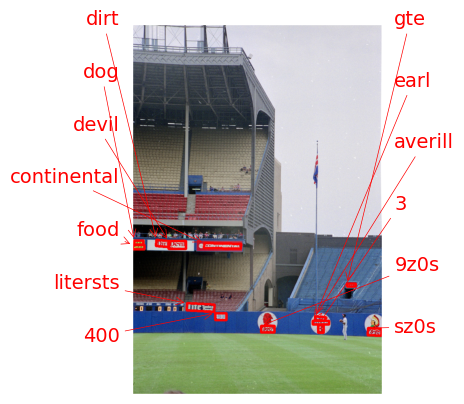

In [16]:
keras_ocr.tools.drawAnnotations(plt.imread(image_file_names[11]),results[0])

# 5. Compare easyocr vs keras_ocr

In [17]:
#easyocr
reader=easyocr.Reader(['en'],gpu=True)
dfs=[]
for im in tqdm(image_file_names[:20]):
    result=reader.readtext(im)
    im_id=im.split('/')[-1].rstrip('.jpg')
    im_df=pd.DataFrame(result,columns=['bbox','text','conf'])
    im_df['img_id']=im_id
    dfs.append(im_df)
easyocr_df=pd.concat(dfs)

  0%|          | 0/20 [00:00<?, ?it/s]

In [18]:
easyocr_df

,bbox,text,conf,img_id
0,"[[67, 23], [143, 23], [143, 64], [67, 64]]",a5,0.060909,f644219f560e3778
1,"[[59, 40], [1004, 40], [1004, 248], [59, 248]]",EXTRA Golden,0.409675,f644219f560e3778
2,"[[83, 863], [939, 863], [939, 1015], [83, 1015]]",Ok-Oyot SYSTEM,0.477909,f644219f560e3778
0,"[[168, 123], [583, 123], [583, 185], [168, 185]]",Richard Florida,0.994673,c613956f36cbd5cd
1,"[[148, 200], [610, 200], [610, 296], [148, 296]]",LA CLASE,0.901598,c613956f36cbd5cd
...,...,...,...,...
0,"[[315.31215814362656, 319.0475386341112], [417...",0-0868,0.432884,9ebc7e767b69db78
0,"[[313, 159], [383, 159], [383, 203], [313, 203]]",BX,0.318862,069a1ecc2b2c40f8
1,"[[369, 129], [606, 129], [606, 204], [369, 204]]",JCEHOTEL,0.794018,069a1ecc2b2c40f8
2,"[[286.6304381980899, 74.2847966121687], [607.4...",HICEBAR,0.539147,069a1ecc2b2c40f8


In [19]:
# keras_ocr
pipeline = keras_ocr.pipeline.Pipeline()
dfs = []
for img in tqdm(image_file_names[:25]):
    results = pipeline.recognize([img])
    result = results[0]
    img_id = img.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame(result, columns=['text', 'bbox'])
    img_df['img_id'] = img_id
    dfs.append(img_df)
kerasocr_df = pd.concat(dfs)

Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


  0%|          | 0/25 [00:00<?, ?it/s]

1/1 [==============================] - 0s 68ms/step


# 6. Plot Results: easyocr vs keras_ocr

In [20]:
def plot_compare(img_fn, easyocr_df, kerasocr_df):
    img_id = img_fn.split('/')[-1].split('.')[0]
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))

    easy_results = easyocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    easy_results = [(x[0], np.array(x[1])) for x in easy_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), 
                                    easy_results, ax=axs[0])
    axs[0].set_title('easyocr results', fontsize=24)

    keras_results = kerasocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    keras_results = [(x[0], np.array(x[1])) for x in keras_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), 
                                    keras_results, ax=axs[1])
    axs[1].set_title('keras_ocr results', fontsize=24)
    plt.show()

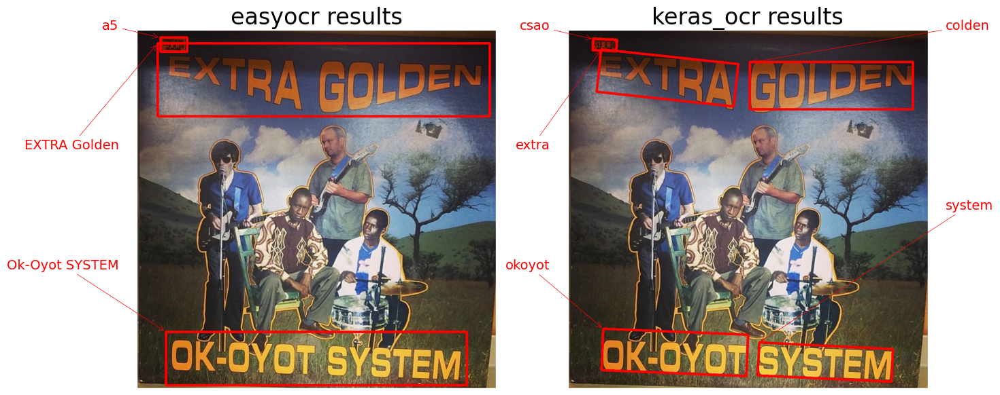

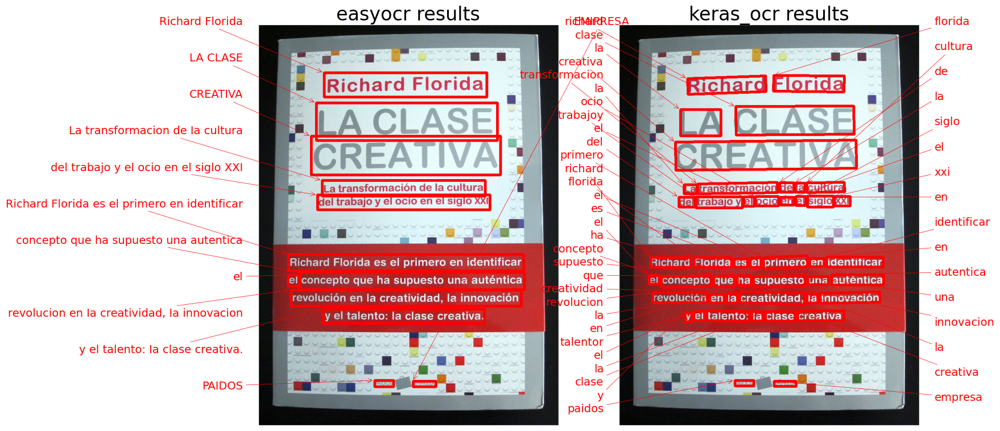

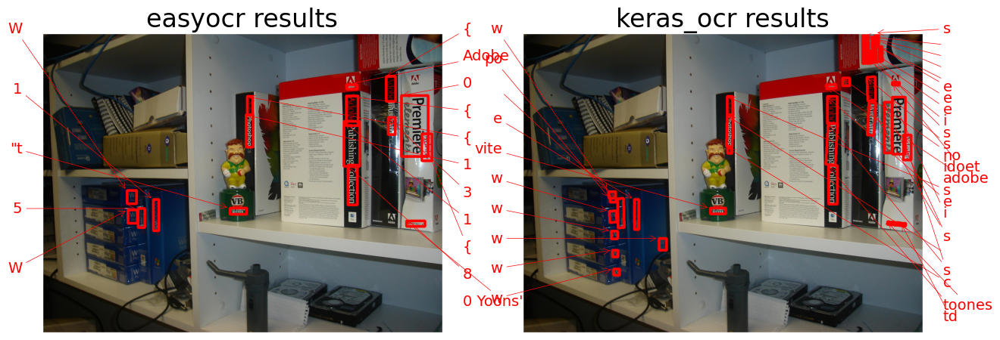

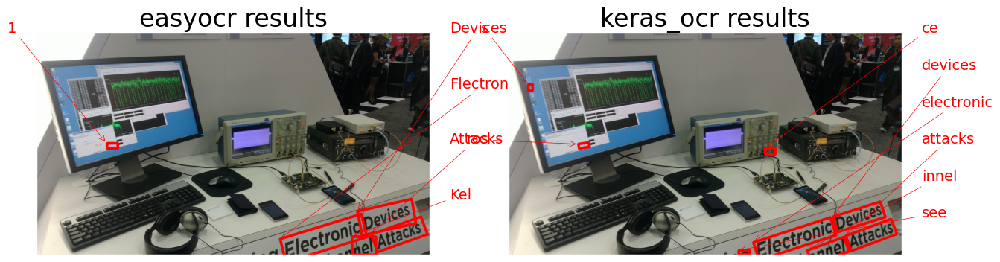

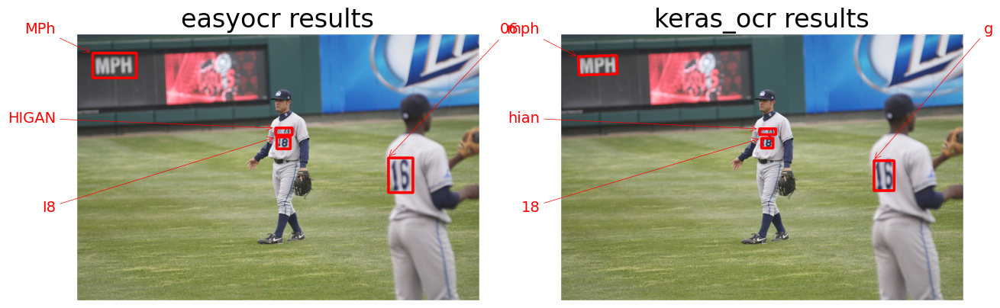

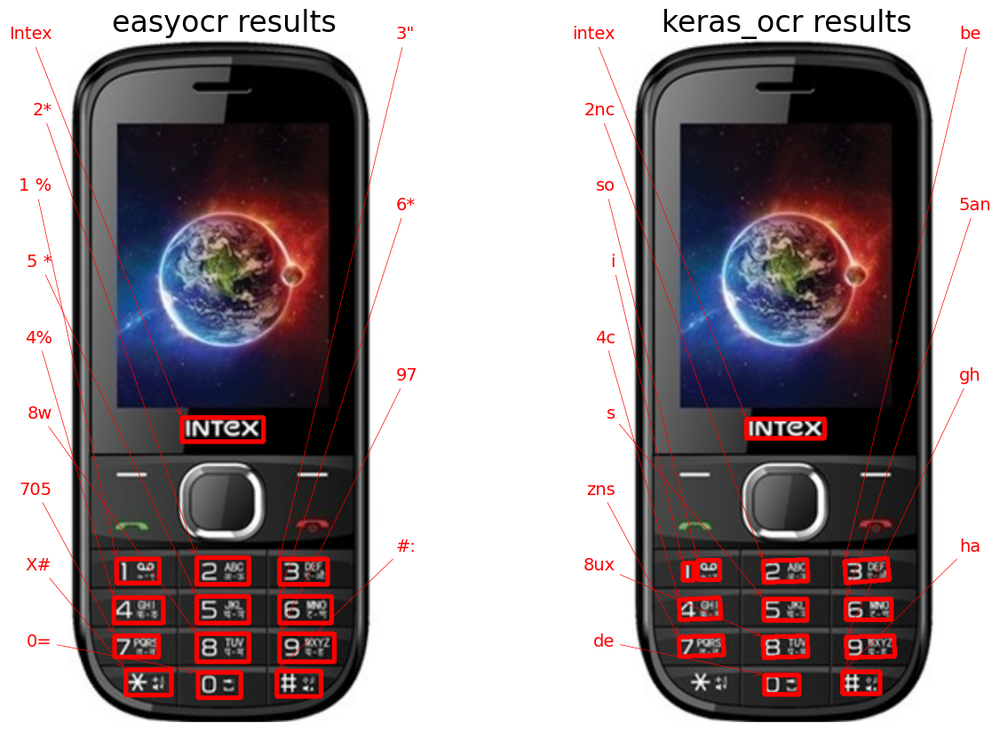

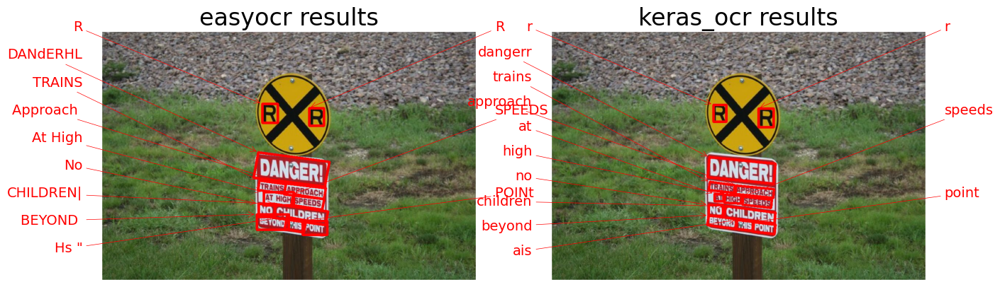

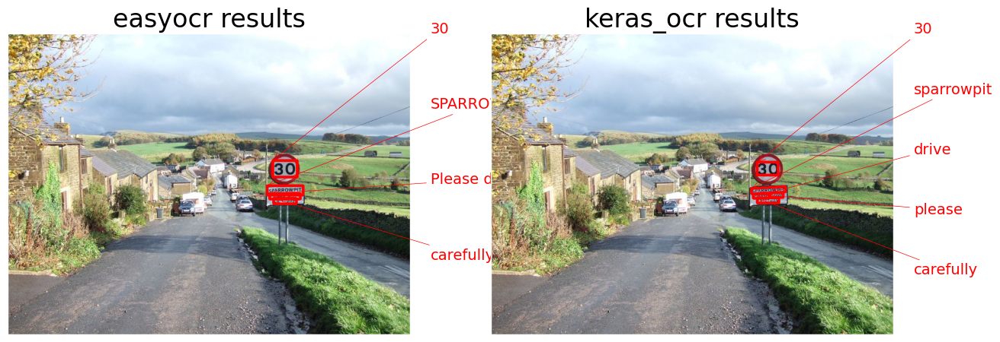

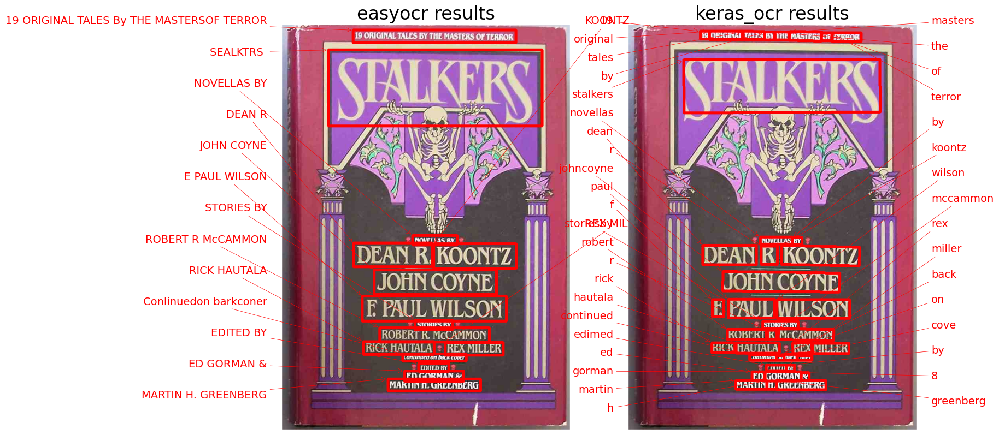

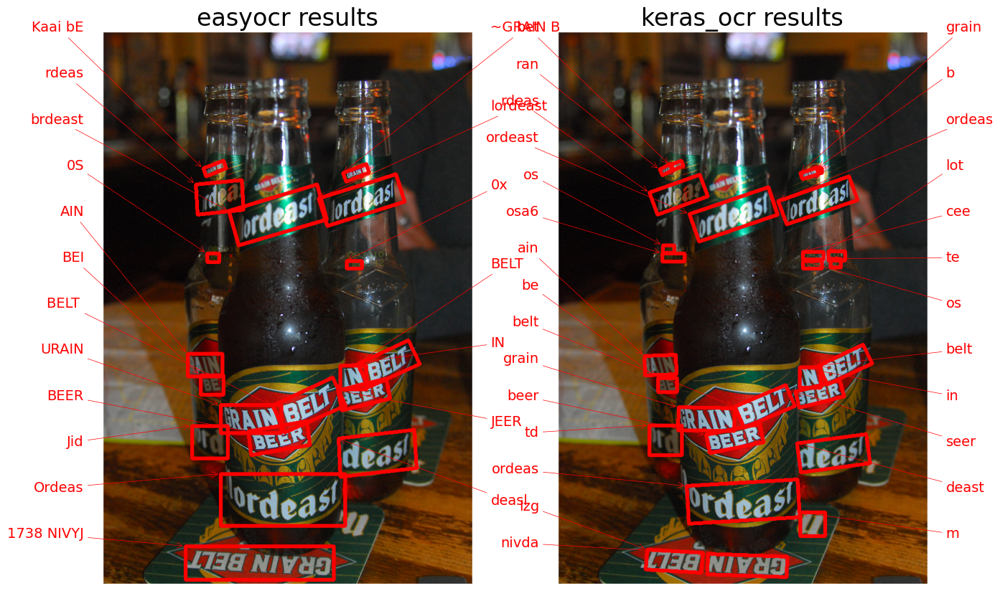

In [21]:
# Loop over results
for img in image_file_names[:10]:
    plot_compare(img, easyocr_df, kerasocr_df)